#Setup google-drive mounting (optional)

In [1]:
# from google.colab import drive
# import os

# drive.mount('/content/drive')

In [2]:
# # prompt: create a symbolic link to a google drive workdir 'xyz' to the root of colab

# # Specify the path to your folder
# gdrive = '/content/drive/MyDrive/AI/2025'
# workdir = '/datasets'
# slink = '/content' + workdir
# fullpath = gdrive + workdir

# # Check if the folder exists
# if os.path.exists(fullpath):
#   # Create the symbolic link
#   try:
#     os.symlink(fullpath, slink)
#     print(f"Symbolic link created from '{fullpath}' to '{slink}'")
#   except FileExistsError:
#     print(f"Symbolic link '{slink}' already exists.")
#   except OSError as e:
#     print(f"Error creating symbolic link: {e}")
# else:
#   print(f"Error: Folder '{fullpath}' not found.")

In [3]:
# !unzip datasets/datasets.zip -d ./datasets/
# !rm datasets/datasets.zip

#Loading real test dataset

In [4]:
import pandas as pd
import warnings

warnings.filterwarnings('ignore')

folder = './datasets/ufpe/'
datapath = folder + 'dataset.csv'
subpath = 'cross-validation/'

IB = 100.0 # initial balance for each asset
#SPLIT_DATE = '2024-12-30 19:00'

# Detais

In [5]:
df = pd.read_csv(datapath)
df = df.rename(columns={'date': 'Datetime'})
df

,Datetime,ATOM,AVAX,AXS,BAND,BAT,BCH,BNB,BTC,CAKE,...,XLM,XRP,XTZ,XVG,XVS,YFI,ZEC,ZEN,ZIL,ZRX
0,2022-01-01 00:00:00,33.400,111.71,94.400,5.090,1.2510,434.8,517.30,46656.13,11.870,...,0.2697,0.8395,4.4100,0.017260,15.32,33450.57,148.40,61.630,0.07587,0.8155
1,2022-01-01 01:00:00,33.670,109.69,93.950,5.071,1.2487,435.3,517.20,46778.14,11.890,...,0.2698,0.8396,4.4740,0.017290,15.30,33707.45,148.00,61.230,0.07594,0.8163
2,2022-01-01 02:00:00,33.800,110.77,94.320,5.049,1.2417,434.9,517.80,46811.77,11.920,...,0.2697,0.8425,4.6750,0.017480,15.32,33668.01,148.10,61.450,0.07586,0.8255
3,2022-01-01 03:00:00,33.410,109.72,93.780,5.037,1.2377,435.2,518.10,46813.20,11.960,...,0.2703,0.8410,4.6340,0.017540,15.28,33573.73,148.00,61.340,0.07572,0.8220
4,2022-01-01 04:00:00,33.730,108.98,93.610,5.005,1.2250,432.8,515.00,46711.05,11.820,...,0.2686,0.8346,4.5770,0.017650,15.25,33758.59,146.70,60.880,0.07523,0.8213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34557,2025-12-10 21:00:00,2.277,14.28,1.093,0.376,0.2596,575.5,896.94,92356.38,2.332,...,0.2511,2.0472,0.4970,0.006260,4.79,3766.00,405.52,9.409,0.00556,0.1440
34558,2025-12-10 22:00:00,2.291,14.26,1.096,0.374,0.2577,576.6,898.30,92509.94,2.339,...,0.2521,2.0549,0.4984,0.006193,4.78,3769.00,400.23,9.332,0.00558,0.1444
34559,2025-12-10 23:00:00,2.267,14.11,1.088,0.371,0.2553,572.6,893.43,92015.37,2.324,...,0.2500,2.0418,0.4936,0.006125,4.75,3750.00,404.43,9.265,0.00552,0.1429
34560,2025-12-11 00:00:00,2.234,13.81,1.062,0.366,0.2482,561.1,883.61,91386.17,2.307,...,0.2464,2.0292,0.4889,0.006083,4.69,3720.00,394.55,9.177,0.00543,0.1409


In [6]:
date_column_name = df.columns[0]
date_format = '%Y-%m-%d' if date_column_name.lower() == 'date' else '%Y-%m-%d %H:%M:%S'

date_column_name, date_format

('Datetime', '%Y-%m-%d %H:%M:%S')

In [7]:
# Converter a coluna para datetime removendo o fuso horário
if date_column_name.lower() == 'date':
    df[date_column_name] = pd.to_datetime(df[date_column_name])
else:
    df[date_column_name] = pd.to_datetime(df[date_column_name]).dt.tz_localize(None)

df

,Datetime,ATOM,AVAX,AXS,BAND,BAT,BCH,BNB,BTC,CAKE,...,XLM,XRP,XTZ,XVG,XVS,YFI,ZEC,ZEN,ZIL,ZRX
0,2022-01-01 00:00:00,33.400,111.71,94.400,5.090,1.2510,434.8,517.30,46656.13,11.870,...,0.2697,0.8395,4.4100,0.017260,15.32,33450.57,148.40,61.630,0.07587,0.8155
1,2022-01-01 01:00:00,33.670,109.69,93.950,5.071,1.2487,435.3,517.20,46778.14,11.890,...,0.2698,0.8396,4.4740,0.017290,15.30,33707.45,148.00,61.230,0.07594,0.8163
2,2022-01-01 02:00:00,33.800,110.77,94.320,5.049,1.2417,434.9,517.80,46811.77,11.920,...,0.2697,0.8425,4.6750,0.017480,15.32,33668.01,148.10,61.450,0.07586,0.8255
3,2022-01-01 03:00:00,33.410,109.72,93.780,5.037,1.2377,435.2,518.10,46813.20,11.960,...,0.2703,0.8410,4.6340,0.017540,15.28,33573.73,148.00,61.340,0.07572,0.8220
4,2022-01-01 04:00:00,33.730,108.98,93.610,5.005,1.2250,432.8,515.00,46711.05,11.820,...,0.2686,0.8346,4.5770,0.017650,15.25,33758.59,146.70,60.880,0.07523,0.8213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34557,2025-12-10 21:00:00,2.277,14.28,1.093,0.376,0.2596,575.5,896.94,92356.38,2.332,...,0.2511,2.0472,0.4970,0.006260,4.79,3766.00,405.52,9.409,0.00556,0.1440
34558,2025-12-10 22:00:00,2.291,14.26,1.096,0.374,0.2577,576.6,898.30,92509.94,2.339,...,0.2521,2.0549,0.4984,0.006193,4.78,3769.00,400.23,9.332,0.00558,0.1444
34559,2025-12-10 23:00:00,2.267,14.11,1.088,0.371,0.2553,572.6,893.43,92015.37,2.324,...,0.2500,2.0418,0.4936,0.006125,4.75,3750.00,404.43,9.265,0.00552,0.1429
34560,2025-12-11 00:00:00,2.234,13.81,1.062,0.366,0.2482,561.1,883.61,91386.17,2.307,...,0.2464,2.0292,0.4889,0.006083,4.69,3720.00,394.55,9.177,0.00543,0.1409


In [8]:
# split_date = pd.to_datetime('2024-08-26')
# #split_date = pd.to_datetime('2025-01-01')

# # Find the first row where the date is equal or greater than split_date
# def get_split_date_index(df, split_date):
#   for i in range(len(df)):
#     if df.iloc[i, 0] >= split_date:
#       return i

# split_idx = get_split_date_index(df, split_date)

split_idx = len(df) - 24*32*6 # +- last 6 months
split_idx, df.iloc[split_idx, 0]

(29954, Timestamp('2025-06-02 02:00:00'))

In [9]:
# split_idx += 17 # adjusting for other forecasts

In [10]:
df_test = df.iloc[split_idx-1:, :]#.drop('Real', axis=1)
df_test

,Datetime,ATOM,AVAX,AXS,BAND,BAT,BCH,BNB,BTC,CAKE,...,XLM,XRP,XTZ,XVG,XVS,YFI,ZEC,ZEN,ZIL,ZRX
29953,2025-06-02 01:00:00,4.331,20.76,2.546,0.654,0.1288,402.0,660.49,105388.59,2.356,...,0.2660,2.1642,0.5678,0.006568,5.88,5250.0,52.70,10.020,0.01134,0.2367
29954,2025-06-02 02:00:00,4.313,20.66,2.526,0.649,0.1281,400.9,659.05,105026.98,2.344,...,0.2652,2.1595,0.5651,0.006541,5.85,5225.0,52.92,10.000,0.01127,0.2352
29955,2025-06-02 03:00:00,4.305,20.57,2.514,0.646,0.1282,399.3,656.68,104829.27,2.339,...,0.2645,2.1574,0.5621,0.006545,5.82,5220.0,52.42,10.070,0.01125,0.2352
29956,2025-06-02 04:00:00,4.298,20.58,2.507,0.645,0.1281,400.7,657.63,104765.48,2.333,...,0.2653,2.1695,0.5613,0.006493,5.80,5268.0,52.18,9.940,0.01125,0.2356
29957,2025-06-02 05:00:00,4.291,20.60,2.510,0.648,0.1284,402.9,657.22,104833.79,2.331,...,0.2657,2.1691,0.5614,0.006526,5.82,5253.0,52.55,9.750,0.01125,0.2361
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34557,2025-12-10 21:00:00,2.277,14.28,1.093,0.376,0.2596,575.5,896.94,92356.38,2.332,...,0.2511,2.0472,0.4970,0.006260,4.79,3766.0,405.52,9.409,0.00556,0.1440
34558,2025-12-10 22:00:00,2.291,14.26,1.096,0.374,0.2577,576.6,898.30,92509.94,2.339,...,0.2521,2.0549,0.4984,0.006193,4.78,3769.0,400.23,9.332,0.00558,0.1444
34559,2025-12-10 23:00:00,2.267,14.11,1.088,0.371,0.2553,572.6,893.43,92015.37,2.324,...,0.2500,2.0418,0.4936,0.006125,4.75,3750.0,404.43,9.265,0.00552,0.1429
34560,2025-12-11 00:00:00,2.234,13.81,1.062,0.366,0.2482,561.1,883.61,91386.17,2.307,...,0.2464,2.0292,0.4889,0.006083,4.69,3720.0,394.55,9.177,0.00543,0.1409


##Loading saved backtests for analysis

In [11]:
# prompt: load all saved backtests from folder into backtests list
import os

def load_backtests(path):
  # Assuming 'backtests' is the directory containing the CSV files
  backtest_dir = os.path.join(path, 'backtests')
  backtests = []
  titles = []
  i = 0

  # Iterate through the files in the directory
  for filename in os.listdir(backtest_dir):
    if filename.endswith(".csv"):
      filepath = os.path.join(backtest_dir, filename)
      try:
        # Read the CSV file into a Pandas DataFrame
        df = pd.read_csv(filepath)
        title = filename.removesuffix('.csv')

        # Append _NEG to column names if the filename ends with _NEG
        if title.endswith('_NEG'):
            neg_cols = {col: f"{col}_NEG" for col in df.columns if col != 'Datetime'}
            df = df.rename(columns=neg_cols)

        backtests.append(df)
        titles.append(title)
        print(f"Backtest loaded[{i}]: {filename}")
        i += 1
      except pd.errors.EmptyDataError:
        print(f"Warning: Skipping empty file: {filename}")
      except pd.errors.ParserError:
        print(f"Warning: Skipping file with parsing error: {filename}")

  return backtests, titles

In [12]:
# loading backtests
backtests, titles = load_backtests(folder + subpath)

Backtest loaded[0]: tide.csv
Backtest loaded[1]: mlp.csv
Backtest loaded[2]: dlinear.csv
Backtest loaded[3]: patch_tst.csv
Backtest loaded[4]: B&H.csv
Backtest loaded[5]: autoformer.csv
Backtest loaded[6]: rnn.csv
Backtest loaded[7]: tft.csv
Backtest loaded[8]: dumb_4cast.csv
Backtest loaded[9]: dilated_rnn.csv
Backtest loaded[10]: tcn.csv
Backtest loaded[11]: nhits.csv
Backtest loaded[12]: nlinear.csv
Backtest loaded[13]: rmok.csv
Backtest loaded[14]: itransformer.csv
Backtest loaded[15]: ts_mixerx.csv
Backtest loaded[16]: stemgnn.csv
Backtest loaded[17]: informer.csv
Backtest loaded[18]: gru.csv
Backtest loaded[19]: ts_mixer.csv
Backtest loaded[20]: deep_ar.csv
Backtest loaded[21]: bitcn.csv
Backtest loaded[22]: mlpmulti.csv
Backtest loaded[23]: deep_npts.csv
Backtest loaded[24]: vanilla.csv
Backtest loaded[25]: lstm.csv
Backtest loaded[26]: fedformer.csv
Backtest loaded[27]: softs.csv


## Trying to select investments with better momentum

In [13]:
# import plotly.graph_objects as go

# # Plot each backtest dataframe
# for i, df in enumerate(backtests):
#     fig = go.Figure()
#     for col in df.columns:
#         if col != date_column_name:
#             fig.add_trace(go.Scatter(x=df[date_column_name], y=df[col], mode='lines', name=col))

#     fig.update_layout(
#         title=f'Backtest: {titles[i]}',
#         xaxis_title='Datetime',
#         yaxis_title='Value'
#     )
#     fig.show()

In [14]:
# Merge all backtest dataframes into one
merged_df = pd.DataFrame()

for i, df in enumerate(backtests):
    # Prefix column names with the backtest title, excluding the date column
    prefixed_cols = {col: f"{titles[i]}_{col}" for col in df.columns if col != date_column_name}
    temp_df = df.rename(columns=prefixed_cols)

    if merged_df.empty:
        merged_df = temp_df
    else:
        # Merge on the date column
        merged_df = pd.merge(merged_df, temp_df, on=date_column_name, how='outer')

# Display the merged dataframe
print("Merged Backtest Dataframe:")
display(merged_df)

Merged Backtest Dataframe:


,Datetime,tide_ATOM,tide_AVAX,tide_AXS,tide_BAND,tide_BAT,tide_BCH,tide_BNB,tide_BTC,tide_CAKE,...,softs_XLM,softs_XRP,softs_XTZ,softs_XVG,softs_XVS,softs_YFI,softs_ZEC,softs_ZEN,softs_ZIL,softs_ZRX
0,2025-06-02 01:00:00,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
1,2025-06-02 02:00:00,99.584392,99.518304,99.214454,99.235474,99.456522,100.274383,99.781980,99.656879,99.490662,...,99.699248,99.782830,99.524480,100.412781,99.489796,99.523810,100.417457,99.800399,100.621118,99.366286
2,2025-06-02 03:00:00,99.399677,99.084778,98.743126,98.776758,99.534161,100.676183,99.423156,99.469278,99.278438,...,99.436090,99.685796,98.996125,100.351413,98.979592,99.428571,101.375274,99.106653,100.800000,99.366286
3,2025-06-02 04:00:00,99.561565,99.036632,98.468185,98.623853,99.611862,100.324432,99.566988,99.408750,99.023769,...,99.736842,100.244894,98.855231,101.155090,98.639456,100.342857,100.911136,100.402816,100.800000,99.535277
4,2025-06-02 05:00:00,99.723982,98.940480,98.350494,98.167261,99.379124,99.776620,99.629102,99.343975,99.108732,...,99.887218,100.226412,98.872843,100.643580,98.979592,100.629387,101.626681,98.483648,100.800000,99.746515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4604,2025-12-10 21:00:00,47.891066,33.550054,37.964498,73.866670,26.490369,69.343071,180.460698,139.277916,83.177098,...,181.762785,125.694006,165.227048,25.694947,133.713951,133.743002,690.095079,55.491961,72.719860,175.261323
4605,2025-12-10 22:00:00,48.185521,33.503065,38.068700,73.473762,26.296488,69.475612,180.734324,139.509492,83.426772,...,181.041790,126.166771,164.762927,25.972932,133.434798,133.636547,681.092803,55.949835,72.981442,175.748160
4606,2025-12-10 23:00:00,47.680741,33.150649,37.790827,72.884400,26.051584,68.993644,179.754500,138.763657,83.965241,...,182.562541,125.362457,166.365160,26.261285,132.597341,134.313639,688.240167,56.354437,72.196695,173.922521
4607,2025-12-11 00:00:00,46.986667,32.445816,36.887737,71.902131,25.327079,67.607988,177.778756,137.814793,83.351037,...,185.229851,124.588842,164.781050,26.442606,130.922428,135.396814,705.474517,56.894830,71.019575,171.488336


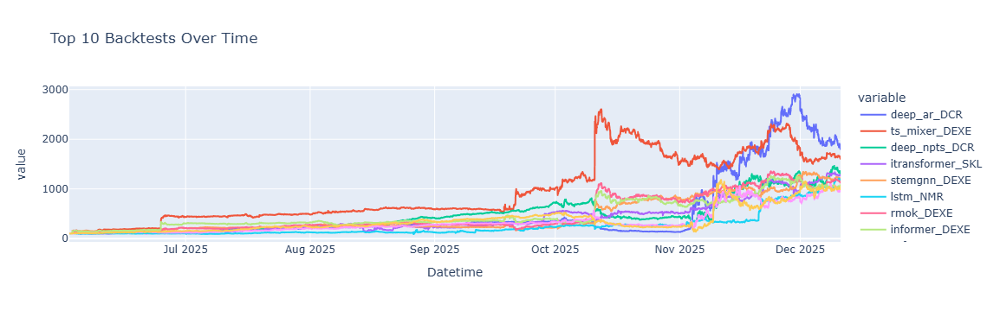

In [15]:
import plotly.express as px

TOP = 10

# Get the last row of the merged dataframe
last_row = merged_df.iloc[-1]

# Drop the 'Datetime' column
last_row_values = last_row.drop(date_column_name)

# Sort the values in descending order and get the top
top_values = last_row_values.sort_values(ascending=False).head(TOP)

# Filter merged_df to include only the columns in top_values, keeping the date column
cols_to_plot = [date_column_name] + top_values.index.tolist()
filtered_merged_df = merged_df[cols_to_plot]

fig = px.line(filtered_merged_df, x=date_column_name, y=filtered_merged_df.columns[1:],
              title=f'Top {TOP} Backtests Over Time')
fig.show()

In [16]:
# Sum all values from top_values
sum_of_top_values = top_values.sum()

# Display the sum in currency format
print(f"Sum of the top {TOP} values: ${sum_of_top_values:,.2f}")

Sum of the top 10 values: $12,511.59


In [17]:
filtered_merged_df['Wallet'] = filtered_merged_df.drop(columns=[date_column_name]).sum(axis=1)
display(filtered_merged_df)

,Datetime,deep_ar_DCR,ts_mixer_DEXE,deep_npts_DCR,itransformer_SKL,stemgnn_DEXE,lstm_NMR,rmok_DEXE,informer_DEXE,softs_DCR,dumb_4cast_DCR,Wallet
0,2025-06-02 01:00:00,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,1000.000000
1,2025-06-02 02:00:00,100.519481,100.113427,99.483204,99.355136,99.886702,98.220641,99.886702,99.886702,100.519481,100.519481,998.390954
2,2025-06-02 03:00:00,100.259740,100.576354,99.740933,98.572087,99.426948,97.983393,100.348581,100.348581,100.259740,100.779894,998.296250
3,2025-06-02 04:00:00,99.935065,100.862550,100.064977,98.387840,99.709873,98.457888,100.634128,100.063843,99.935065,100.453534,998.504765
4,2025-06-02 05:00:00,100.584416,101.156757,99.418980,98.157531,99.419875,97.746145,100.927668,100.355720,100.584416,101.106253,999.457761
...,...,...,...,...,...,...,...,...,...,...,...,...
4604,2025-12-10 21:00:00,1872.456509,1642.048017,1348.704397,1272.438303,1210.075258,1190.471706,1146.953402,1054.576217,960.540479,1029.596913,12727.861201
4605,2025-12-10 22:00:00,1870.715499,1639.954637,1347.450371,1270.389288,1208.532581,1182.036122,1145.491197,1055.922370,961.434421,1028.639594,12710.566080
4606,2025-12-10 23:00:00,1846.341356,1627.394351,1329.894015,1279.677268,1199.276524,1178.872778,1136.717969,1064.072015,974.126625,1015.237123,12651.610023
4607,2025-12-11 00:00:00,1802.816100,1610.228627,1298.543378,1268.242296,1186.626579,1168.328299,1124.727890,1075.415477,997.644892,991.304141,12523.877678


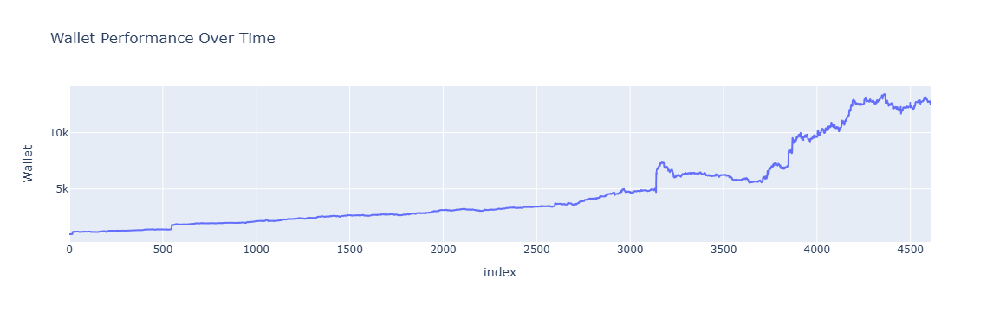

In [18]:
fig = px.line(filtered_merged_df, y='Wallet', title='Wallet Performance Over Time')
fig.show()

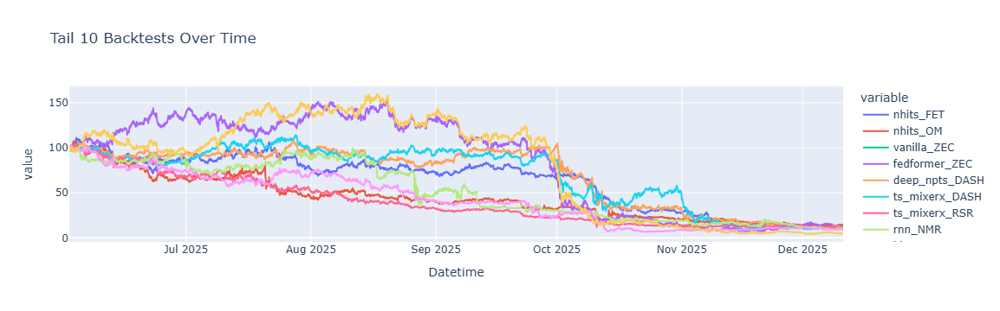

In [19]:
import plotly.express as px

TAIL = TOP

# Get the last row of the merged dataframe
last_row = merged_df.iloc[-1]

# Drop the 'Datetime' column
last_row_values = last_row.drop(date_column_name)

# Sort the values in descending order and get the tail
tail_values = last_row_values.sort_values(ascending=False).tail(TAIL)

# Filter merged_df to include only the columns in tail_values, keeping the date column
cols_to_plot = [date_column_name] + tail_values.index.tolist()
filtered_merged_df = merged_df[cols_to_plot]

fig = px.line(filtered_merged_df, x=date_column_name, y=filtered_merged_df.columns[1:],
              title=f'Tail {TAIL} Backtests Over Time')
fig.show()

In [20]:
# Calculate the momentum for each column in merged_df
# Momentum is calculated as the percentage change from the first value in each column
momentum_df = merged_df.copy()

for col in momentum_df.columns:
    if col != date_column_name:
        initial_value = momentum_df[col].iloc[0]
        momentum_df[col] = ((momentum_df[col] - initial_value) / initial_value) * 100

# Display the momentum dataframe
print("Momentum Dataframe (Percentage Change from Start):")
display(momentum_df)

Momentum Dataframe (Percentage Change from Start):


,Datetime,tide_ATOM,tide_AVAX,tide_AXS,tide_BAND,tide_BAT,tide_BCH,tide_BNB,tide_BTC,tide_CAKE,...,softs_XLM,softs_XRP,softs_XTZ,softs_XVG,softs_XVS,softs_YFI,softs_ZEC,softs_ZEN,softs_ZIL,softs_ZRX
0,2025-06-02 01:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2025-06-02 02:00:00,-0.415608,-0.481696,-0.785546,-0.764526,-0.543478,0.274383,-0.218020,-0.343121,-0.509338,...,-0.300752,-0.217170,-0.475520,0.412781,-0.510204,-0.476190,0.417457,-0.199601,0.621118,-0.633714
2,2025-06-02 03:00:00,-0.600323,-0.915222,-1.256874,-1.223242,-0.465839,0.676183,-0.576844,-0.530722,-0.721562,...,-0.563910,-0.314204,-1.003875,0.351413,-1.020408,-0.571429,1.375274,-0.893347,0.800000,-0.633714
3,2025-06-02 04:00:00,-0.438435,-0.963368,-1.531815,-1.376147,-0.388138,0.324432,-0.433012,-0.591250,-0.976231,...,-0.263158,0.244894,-1.144769,1.155090,-1.360544,0.342857,0.911136,0.402816,0.800000,-0.464723
4,2025-06-02 05:00:00,-0.276018,-1.059520,-1.649506,-1.832739,-0.620876,-0.223380,-0.370898,-0.656025,-0.891268,...,-0.112782,0.226412,-1.127157,0.643580,-1.020408,0.629387,1.626681,-1.516352,0.800000,-0.253485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4604,2025-12-10 21:00:00,-52.108934,-66.449946,-62.035502,-26.133330,-73.509631,-30.656929,80.460698,39.277916,-16.822902,...,81.762785,25.694006,65.227048,-74.305053,33.713951,33.743002,590.095079,-44.508039,-27.280140,75.261323
4605,2025-12-10 22:00:00,-51.814479,-66.496935,-61.931300,-26.526238,-73.703512,-30.524388,80.734324,39.509492,-16.573228,...,81.041790,26.166771,64.762927,-74.027068,33.434798,33.636547,581.092803,-44.050165,-27.018558,75.748160
4606,2025-12-10 23:00:00,-52.319259,-66.849351,-62.209173,-27.115600,-73.948416,-31.006356,79.754500,38.763657,-16.034759,...,82.562541,25.362457,66.365160,-73.738715,32.597341,34.313639,588.240167,-43.645563,-27.803305,73.922521
4607,2025-12-11 00:00:00,-53.013333,-67.554184,-63.112263,-28.097869,-74.672921,-32.392012,77.778756,37.814793,-16.648963,...,85.229851,24.588842,64.781050,-73.557394,30.922428,35.396814,605.474517,-43.105170,-28.980425,71.488336


---
## Continuing the total analysis

In [21]:
# folder # './datasets/crypto/hourly/'
# path # folder + 'forecasts/' # forecasts without cross-validation
# cross_plain_path # folder + 'cross-validation/plain/' # forecasts with cross-validation (no refit)
# cross_refit_path # folder + 'cross-validation/refit/' # forecasts with cross-validation and refit

# df # original dataset loaded from .csv

# date_column_name # 'Datetime' or 'Date'
# date_format # '%Y-%m-%d' or '%Y-%m-%d %H:%M:%S'
# split_idx # 11616 (index where training and testing datasets are split, separated by provided date)

# df_test # df from split_idx dropped by column 'Real'

# MODEL_NAMES # list of all used models (appended by 'dumb_4cast' later)

# forecasts # forecasts without cross-validation
# plain_forecasts # forecasts with cross-validation (no refit)
# refit_forecasts # forecasts with cross-validation and refit

# IB # 100.0 initial balance for each asset
# SPLIT_DATE = '2024-08-26'

# bh_df # baseline buy-and-hold dataframe
# dumb_4cast # simple one day shit from df_train

# backtests # backtests calculated from forecasts
# plain_backtests # backtests calculated from plain_forecasts
# refit_backtests # backtests calculated from refit_forecasts

In [22]:
# # prompt: create a 10x10 pandas dataframe and initialize each cell with i value
# df_new = pd.DataFrame([[i for j in range(10)] for i in range(10)])
# display(df_new)
# df_new.sum(axis=1)

In [23]:
# prompt: create a dataframe backtest's sums with same indexes of wallet[0] and one column for each entry in wallets

# Assuming 'backtests' list is already populated as in the provided code
# and 'wallet0' is correctly assigned to backtests[0].

def gen_backtest_sum(dfs):
  df = dfs[0]
  btsums = pd.DataFrame(index=df.index)  # Use wallet0's index
  btsums[date_column_name] = df[date_column_name]
  cols = len(df.columns) - 1

  for i, df in enumerate(dfs):
      # Calculate the sum of all columns except the first one (date)
      column_sum = df.iloc[:, 1:].sum(axis=1)
      btsums[titles[i]] = column_sum / cols

  return btsums

bt_sums = gen_backtest_sum(backtests)
# plain_bt_sums = gen_backtest_sum(plain_backtests)
# plainbc_bt_sums = gen_backtest_sum(plain_btc_backtests)
# refit_bt_sums = gen_backtest_sum(refit_backtests)

In [24]:
# prompt: convert btsums into a string dataframe where every number (except datetime column) is converted to a currency string (starting with $, every 3 digits separated by period, 2 decimals)

import pandas as pd
def format_currency_dataframe(df, date_column_name):
  """
  Converts a pandas DataFrame to a string DataFrame, formatting numeric columns
  as currency strings.

  Args:
    df: The input pandas DataFrame.
    date_column_name: The name of the datetime column to exclude from formatting.

  Returns:
    A new pandas DataFrame where numeric columns are formatted as currency strings.
  """
  df_str = df.copy()
  for col in df_str.columns:
    if col != date_column_name:
      # Check if the column is numeric before formatting
      if pd.api.types.is_numeric_dtype(df_str[col]):
        df_str[col] = df_str[col].apply(lambda x: f'${x:,.2f}')
  return df_str

# Example usage:
bt_sums_currency = format_currency_dataframe(bt_sums, date_column_name)
# plain_bt_sums_currency = format_currency_dataframe(plain_bt_sums, date_column_name)
# plainbc_bt_sums_currency = format_currency_dataframe(plainbc_bt_sums, date_column_name)
# refit_bt_sums_currency = format_currency_dataframe(refit_bt_sums, date_column_name)

# Display the currency formatted DataFrames
print("Currency Formatted bt_sums:")
display(bt_sums_currency)

# print("\nCurrency Formatted plain_bt_sums:")
# display(plain_bt_sums_currency)

# print("\nCurrency Formatted plainbc_bt_sums:")
# display(plainbc_bt_sums_currency)

# print("\nCurrency Formatted refit_bt_sums:")
# display(refit_bt_sums_currency)

Currency Formatted bt_sums:


,Datetime,tide,mlp,dlinear,patch_tst,B&H,autoformer,rnn,tft,dumb_4cast,...,gru,ts_mixer,deep_ar,bitcn,mlpmulti,deep_npts,vanilla,lstm,fedformer,softs
0,2025-06-02 01:00:00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,...,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00
1,2025-06-02 02:00:00,$99.66,$99.51,$100.57,$100.61,$99.41,$99.49,$100.23,$99.60,$99.54,...,$99.41,$100.43,$99.61,$100.59,$99.76,$99.70,$100.60,$99.58,$100.60,$99.63
2,2025-06-02 03:00:00,$99.37,$99.20,$100.76,$100.97,$99.05,$99.19,$100.30,$99.39,$99.24,...,$99.05,$100.69,$99.23,$100.96,$99.69,$99.49,$100.97,$99.26,$100.97,$99.41
3,2025-06-02 04:00:00,$99.35,$99.16,$100.91,$101.16,$98.87,$99.10,$100.31,$99.28,$99.21,...,$98.87,$100.75,$99.13,$101.12,$99.65,$99.35,$101.15,$99.10,$101.15,$99.31
4,2025-06-02 05:00:00,$99.33,$99.18,$100.92,$101.19,$98.85,$99.12,$100.31,$99.22,$99.17,...,$98.85,$100.71,$99.13,$101.16,$99.67,$99.36,$101.18,$99.07,$101.18,$99.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4604,2025-12-10 21:00:00,$100.58,$152.30,$96.49,$172.79,$78.40,$210.99,$107.97,$106.52,$164.30,...,$79.34,$110.18,$150.33,$76.90,$157.49,$149.60,$167.37,$110.14,$167.37,$113.59
4605,2025-12-10 22:00:00,$100.47,$152.52,$96.36,$172.56,$78.29,$210.95,$107.85,$106.45,$164.55,...,$79.23,$110.25,$150.35,$76.97,$157.71,$149.58,$167.16,$110.00,$167.16,$113.52
4606,2025-12-10 23:00:00,$99.97,$152.19,$96.78,$174.15,$77.83,$211.91,$107.37,$105.83,$164.94,...,$78.77,$109.69,$149.32,$77.10,$157.52,$149.05,$168.69,$109.27,$168.69,$113.84
4607,2025-12-11 00:00:00,$98.64,$150.28,$96.13,$176.53,$76.75,$212.94,$106.05,$104.72,$163.02,...,$77.71,$108.21,$147.27,$76.55,$157.26,$147.12,$171.00,$107.93,$171.00,$113.55


In [25]:
# prompt: remove cols from bt_sums_currency, except Datetime, where last row is lower than IB

# Identify columns where the last row value is less than IB
cols_to_drop = [col for col in bt_sums.columns if col != date_column_name and bt_sums[col].iloc[-1] < IB]

# Drop the identified columns
bt_sums_filtered = bt_sums.drop(columns=cols_to_drop)

# Display the filtered DataFrame
print("\nFiltered bt_sums (currency formatted, excluding columns with last row < IB):")
display(format_currency_dataframe(bt_sums_filtered, date_column_name))


Filtered bt_sums (currency formatted, excluding columns with last row < IB):


,Datetime,mlp,patch_tst,autoformer,rnn,tft,dumb_4cast,dilated_rnn,tcn,rmok,...,ts_mixerx,informer,ts_mixer,deep_ar,mlpmulti,deep_npts,vanilla,lstm,fedformer,softs
0,2025-06-02 01:00:00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,...,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00,$100.00
1,2025-06-02 02:00:00,$99.51,$100.61,$99.49,$100.23,$99.60,$99.54,$100.43,$99.52,$100.48,...,$99.69,$100.59,$100.43,$99.61,$99.76,$99.70,$100.60,$99.58,$100.60,$99.63
2,2025-06-02 03:00:00,$99.20,$100.97,$99.19,$100.30,$99.39,$99.24,$100.20,$99.29,$100.63,...,$99.49,$100.97,$100.69,$99.23,$99.69,$99.49,$100.97,$99.26,$100.97,$99.41
3,2025-06-02 04:00:00,$99.16,$101.16,$99.10,$100.31,$99.28,$99.21,$100.31,$99.13,$100.84,...,$99.41,$101.15,$100.75,$99.13,$99.65,$99.35,$101.15,$99.10,$101.15,$99.31
4,2025-06-02 05:00:00,$99.18,$101.19,$99.12,$100.31,$99.22,$99.17,$100.29,$99.13,$100.84,...,$99.45,$101.16,$100.71,$99.13,$99.67,$99.36,$101.18,$99.07,$101.18,$99.29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4604,2025-12-10 21:00:00,$152.30,$172.79,$210.99,$107.97,$106.52,$164.30,$126.93,$186.42,$119.60,...,$141.54,$153.40,$110.18,$150.33,$157.49,$149.60,$167.37,$110.14,$167.37,$113.59
4605,2025-12-10 22:00:00,$152.52,$172.56,$210.95,$107.85,$106.45,$164.55,$126.88,$186.69,$119.81,...,$141.70,$153.43,$110.25,$150.35,$157.71,$149.58,$167.16,$110.00,$167.16,$113.52
4606,2025-12-10 23:00:00,$152.19,$174.15,$211.91,$107.37,$105.83,$164.94,$126.27,$185.70,$119.16,...,$141.75,$154.82,$109.69,$149.32,$157.52,$149.05,$168.69,$109.27,$168.69,$113.84
4607,2025-12-11 00:00:00,$150.28,$176.53,$212.94,$106.05,$104.72,$163.02,$125.46,$183.69,$117.88,...,$141.18,$156.46,$108.21,$147.27,$157.26,$147.12,$171.00,$107.93,$171.00,$113.55


# Plot

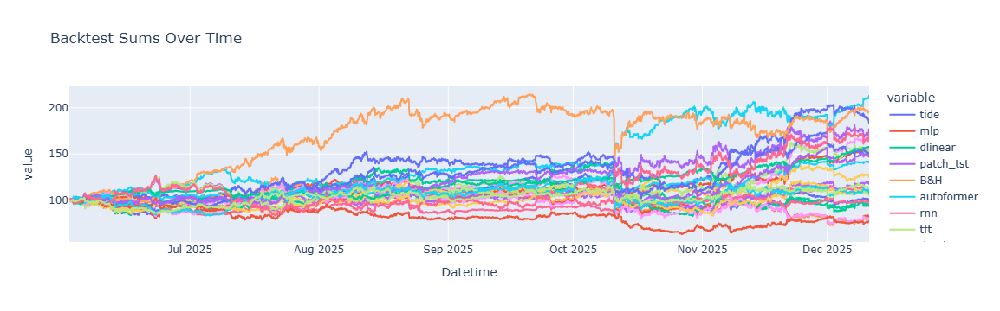

In [26]:
# prompt: plot bt_sums_filtered using plotly

import plotly.express as px

wallet = bt_sums#_filtered

fig = px.line(wallet, x=date_column_name, y=wallet.columns[1:],
              title='Backtest Sums Over Time')
fig.show()
